In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import torch
import torch.optim as optim
import scipy
import seaborn as sns
from datetime import datetime, timedelta

from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import preprocessing as pp

from rnn import RNN
from lstm import LSTM

In [2]:
raw_data = pd.read_csv('consumption_and_temperatures.csv')
raw_data

,timestamp,NO1_consumption,NO1_temperature,NO2_consumption,NO2_temperature,NO3_consumption,NO3_temperature,NO4_consumption,NO4_temperature,NO5_consumption,NO5_temperature
0,2017-05-01 00:00:00+00:00,3325.431995,2.1,3534.588000,5.0,2674.838000,5.5,2061.209000,0.2,1609.089000,3.9
1,2017-05-01 01:00:00+00:00,3344.690998,1.8,3560.209000,4.1,2678.188000,4.0,2045.436000,0.1,1623.485000,3.2
2,2017-05-01 02:00:00+00:00,3398.359002,3.2,3596.149000,3.1,2678.341000,3.7,2020.007000,0.1,1634.128000,2.7
3,2017-05-01 03:00:00+00:00,3430.220001,3.6,3594.042000,2.3,2684.172000,3.2,2021.920000,0.1,1647.906000,2.3
4,2017-05-01 04:00:00+00:00,3606.750000,3.4,3665.091000,2.6,2733.345000,2.7,2045.913000,0.1,1679.176000,2.3
...,...,...,...,...,...,...,...,...,...,...,...
58459,2023-12-31 19:00:00+00:00,5608.067736,-4.7,4962.057148,4.1,3837.204332,-3.7,2806.182692,-6.5,2224.449164,6.3
58460,2023-12-31 20:00:00+00:00,5469.722792,-4.6,4864.162484,4.7,3773.021260,-3.6,2764.928700,-6.4,2175.957992,6.3
58461,2023-12-31 21:00:00+00:00,5321.221040,-4.5,4793.361440,4.6,3725.022064,-4.2,2738.213476,-6.4,2137.724404,6.2
58462,2023-12-31 22:00:00+00:00,5222.770756,-4.5,4742.807424,4.6,3668.956000,-4.2,2699.056760,-6.5,2110.928436,5.7


### Look for na values

In [3]:
raw_data.isna().sum().sort_values(ascending=False)

timestamp          0
NO1_consumption    0
NO1_temperature    0
NO2_consumption    0
NO2_temperature    0
NO3_consumption    0
NO3_temperature    0
NO4_consumption    0
NO4_temperature    0
NO5_consumption    0
NO5_temperature    0
dtype: int64

In [4]:
raw_data.isnull().sum().sort_values(ascending=False)

timestamp          0
NO1_consumption    0
NO1_temperature    0
NO2_consumption    0
NO2_temperature    0
NO3_consumption    0
NO3_temperature    0
NO4_consumption    0
NO4_temperature    0
NO5_consumption    0
NO5_temperature    0
dtype: int64

In [5]:
raw_data['timestamp'] = pd.to_datetime(raw_data['timestamp'])

### Plot inputs and targets

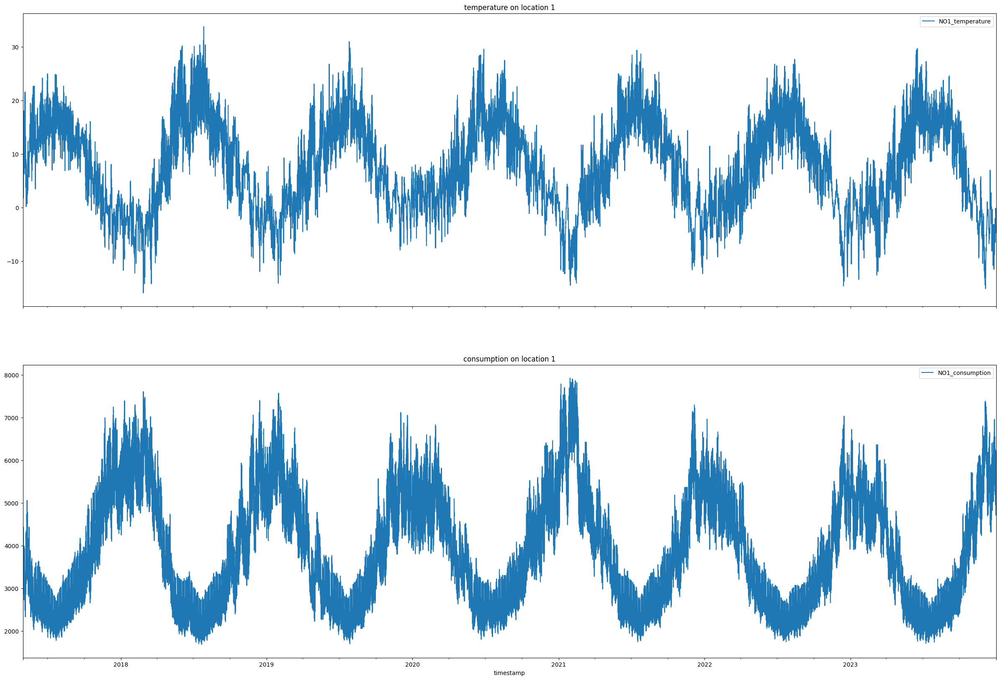

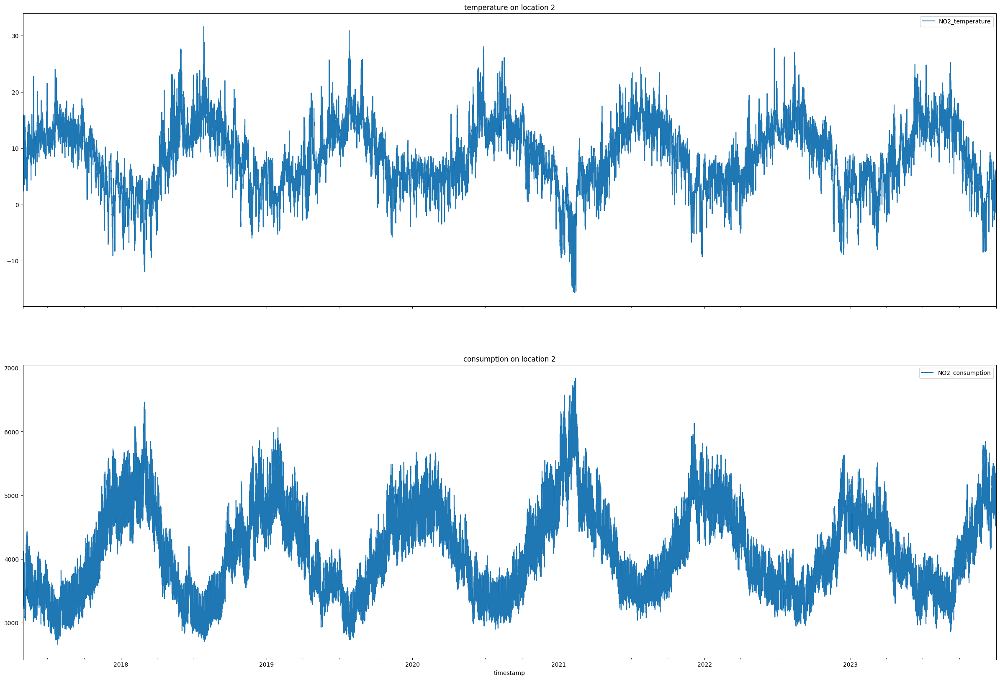

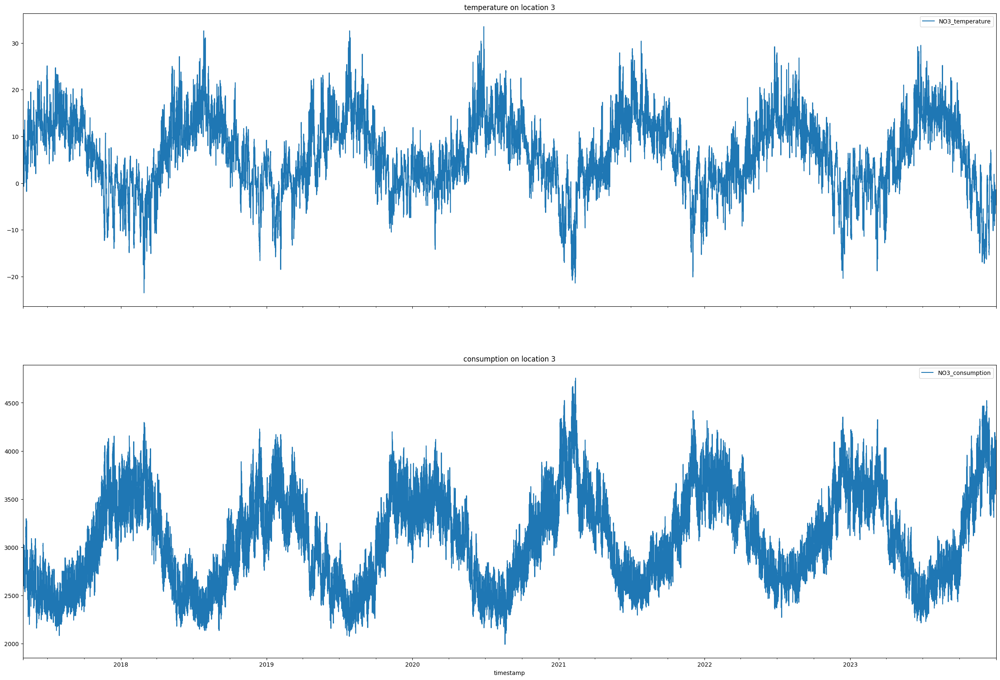

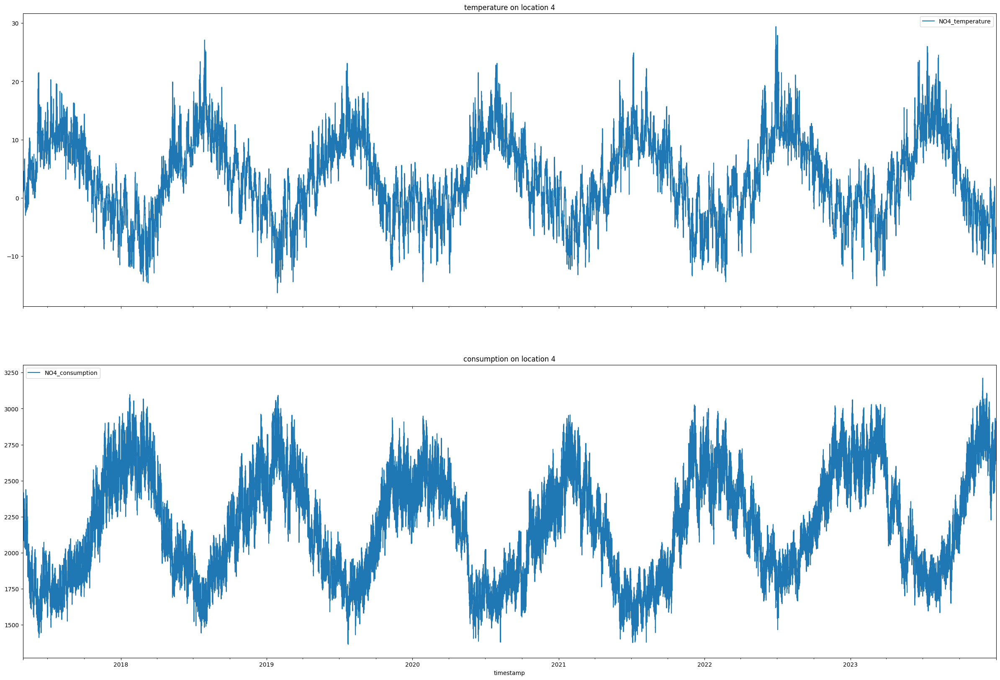

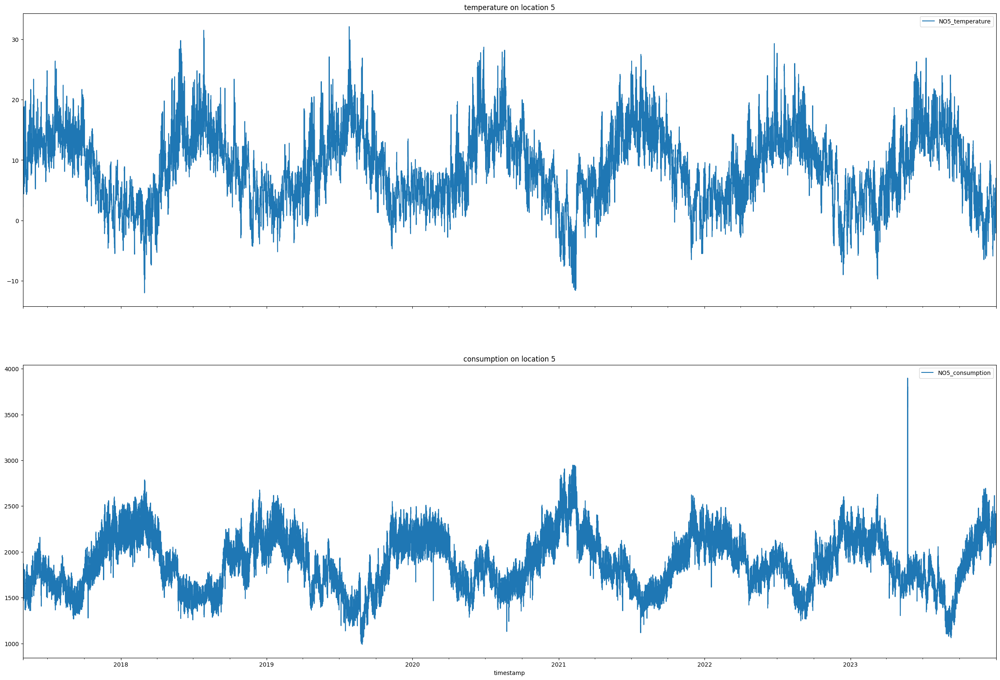

In [6]:
for i in range(1, 6):
    fig, axs = plt.subplots(2, 1, figsize=(30, 20), sharex=True)

    raw_data[['timestamp',f'NO{i}_temperature']].set_index('timestamp').plot(ax=axs[0], title=f'temperature on location {i}')
    raw_data[['timestamp',f'NO{i}_consumption']].set_index('timestamp').plot(ax=axs[1], title=f'consumption on location {i}')
    plt.plot()

### Look for correlations

<Axes: >

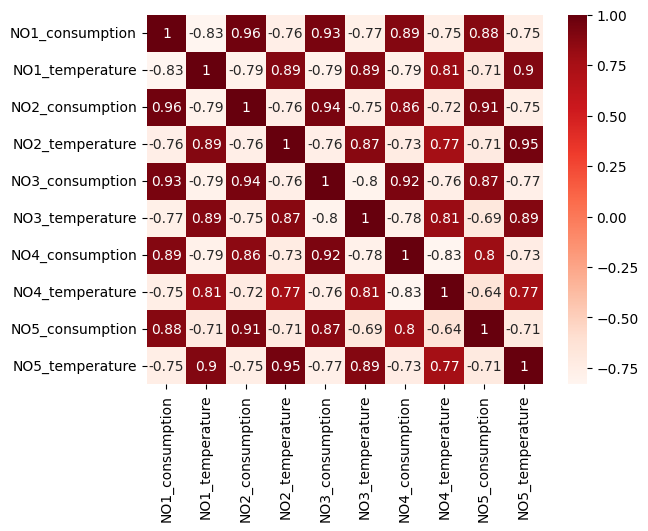

In [7]:
plt.figure()
sns.heatmap(raw_data.corr(method='pearson', numeric_only=True), annot=True, cmap=plt.cm.Reds)


<Axes: >

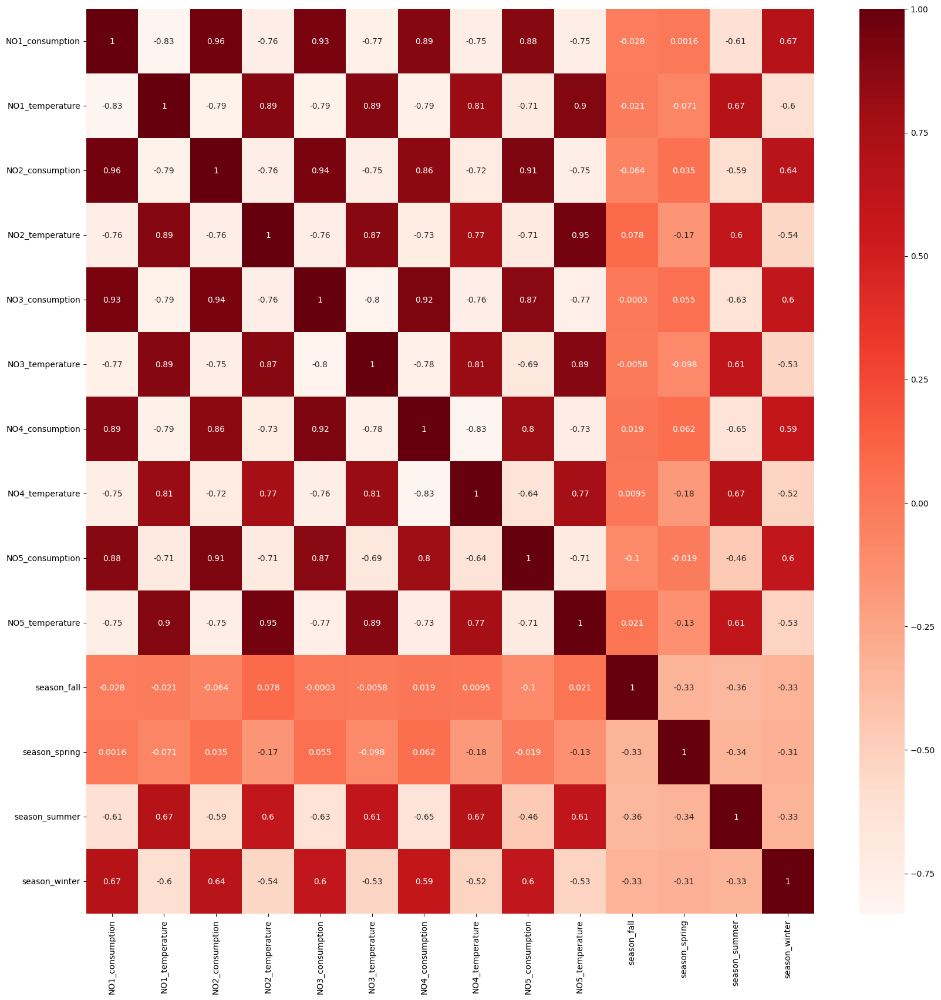

In [8]:
data_seasons = pp.add_season_columns(raw_data)
plt.figure(figsize=(20, 20))
sns.heatmap(data_seasons.corr(method='pearson', numeric_only=True), annot=True, cmap=plt.cm.Reds)

### Plot output by input

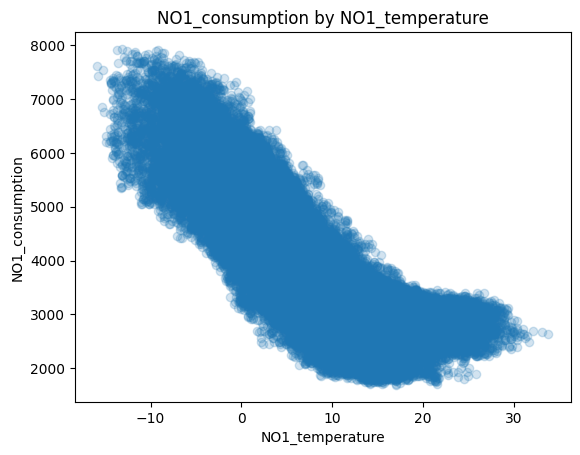

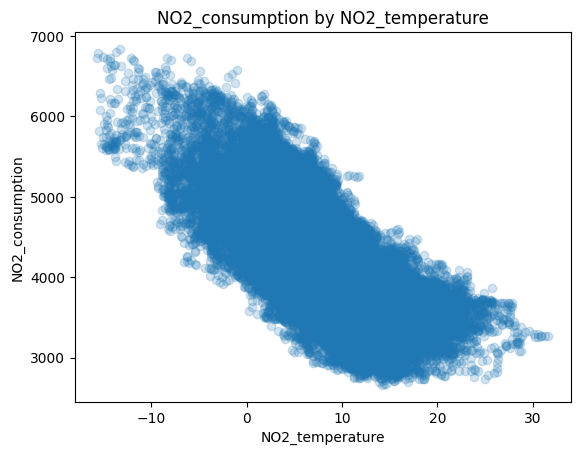

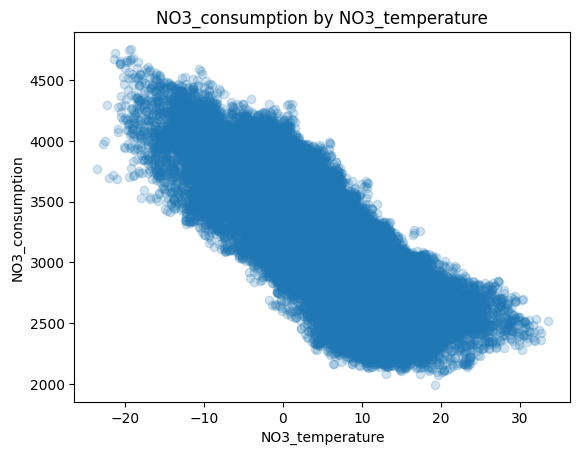

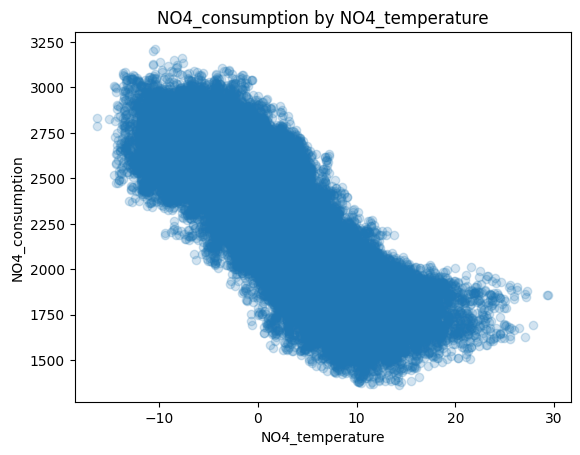

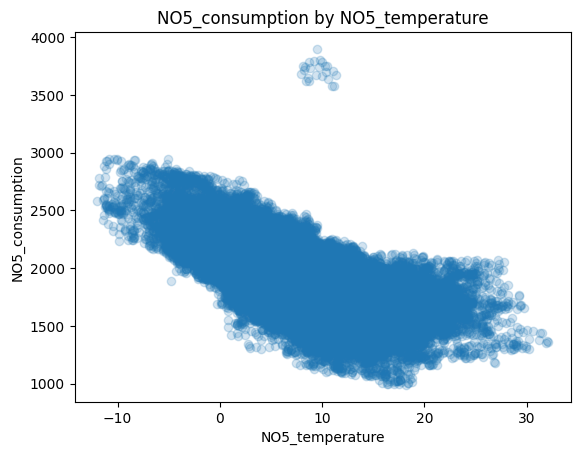

In [10]:
for i in range(1, 6):
    plt.figure()
    plt.scatter(raw_data[f'NO{i}_temperature'], raw_data[f'NO{i}_consumption'], alpha=0.2)
    plt.title(f'NO{i}_consumption by NO{i}_temperature')
    plt.xlabel(f'NO{i}_temperature')
    plt.ylabel(f'NO{i}_consumption')
    plt.plot()

In [16]:
data_hours = pp.add_hour_columns(raw_data)
data_hours.columns

Index(['timestamp', 'NO1_consumption', 'NO1_temperature', 'NO2_consumption',
       'NO2_temperature', 'NO3_consumption', 'NO3_temperature',
       'NO4_consumption', 'NO4_temperature', 'NO5_consumption',
       'NO5_temperature', 'season', 'hour_0', 'hour_1', 'hour_2', 'hour_3',
       'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22',
       'hour_23'],
      dtype='object')

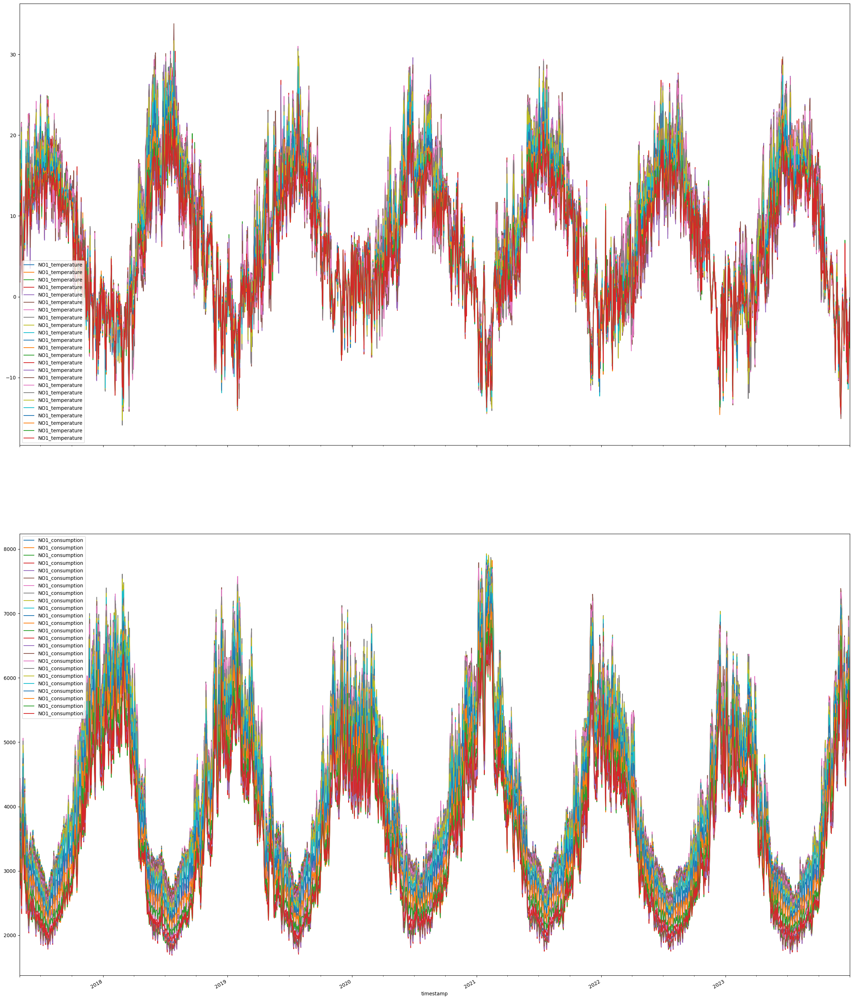

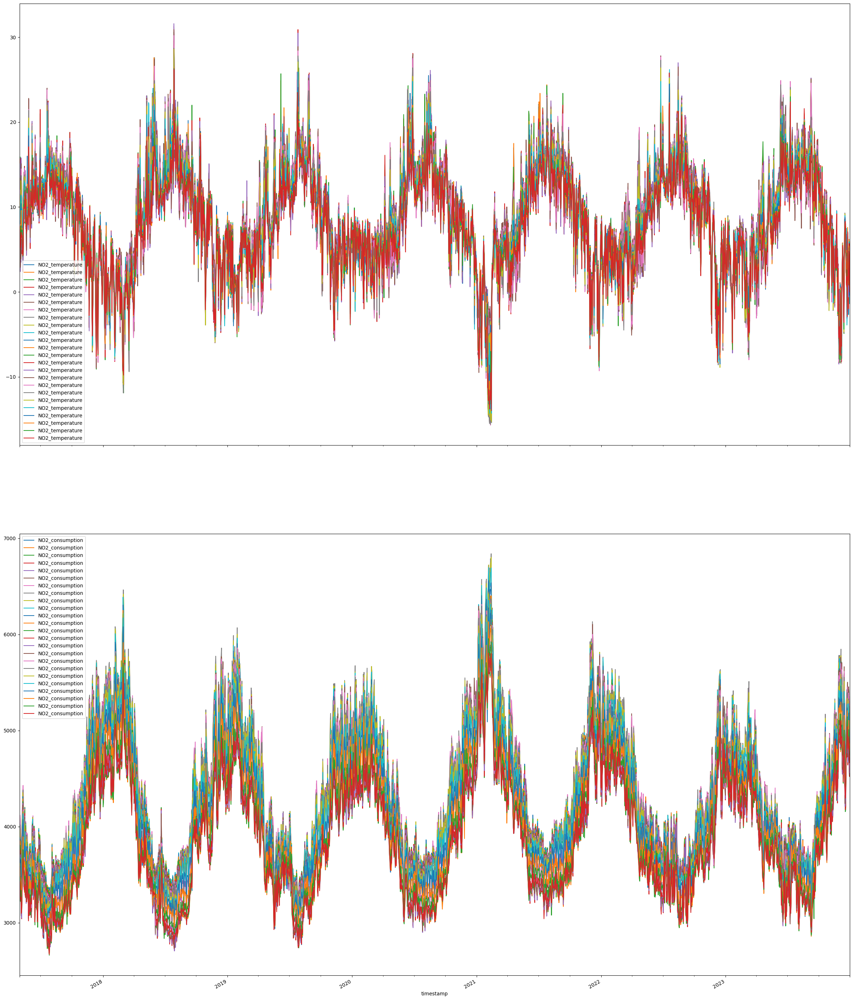

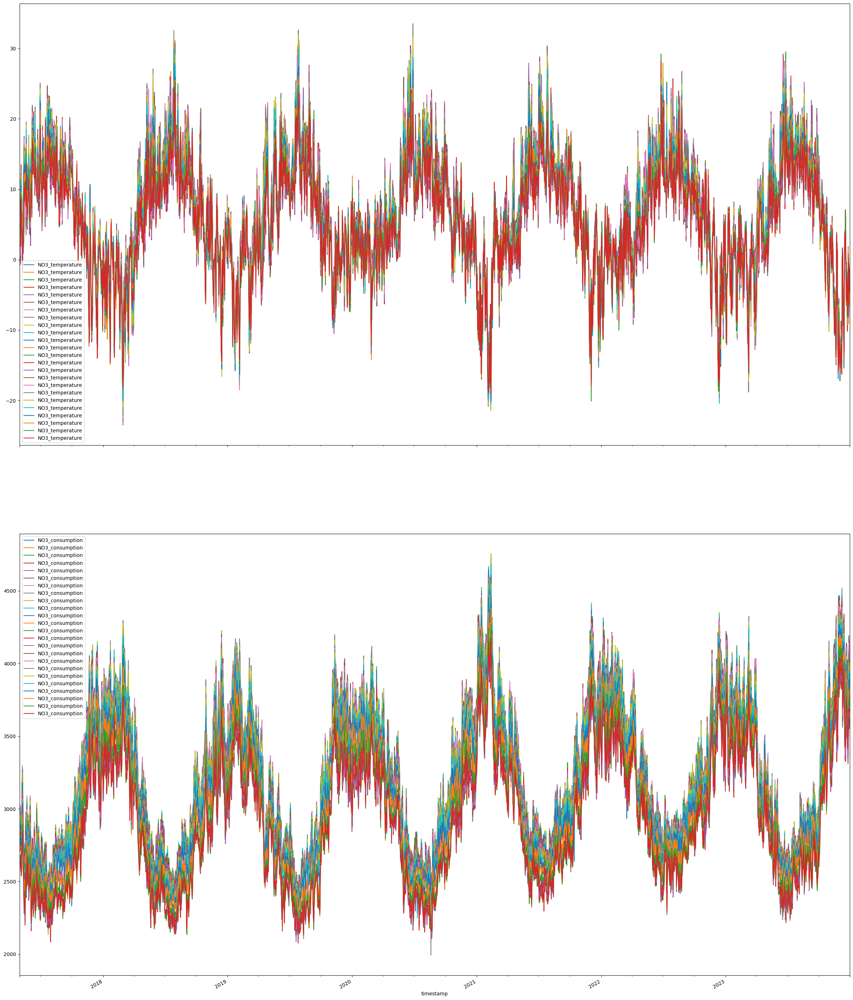

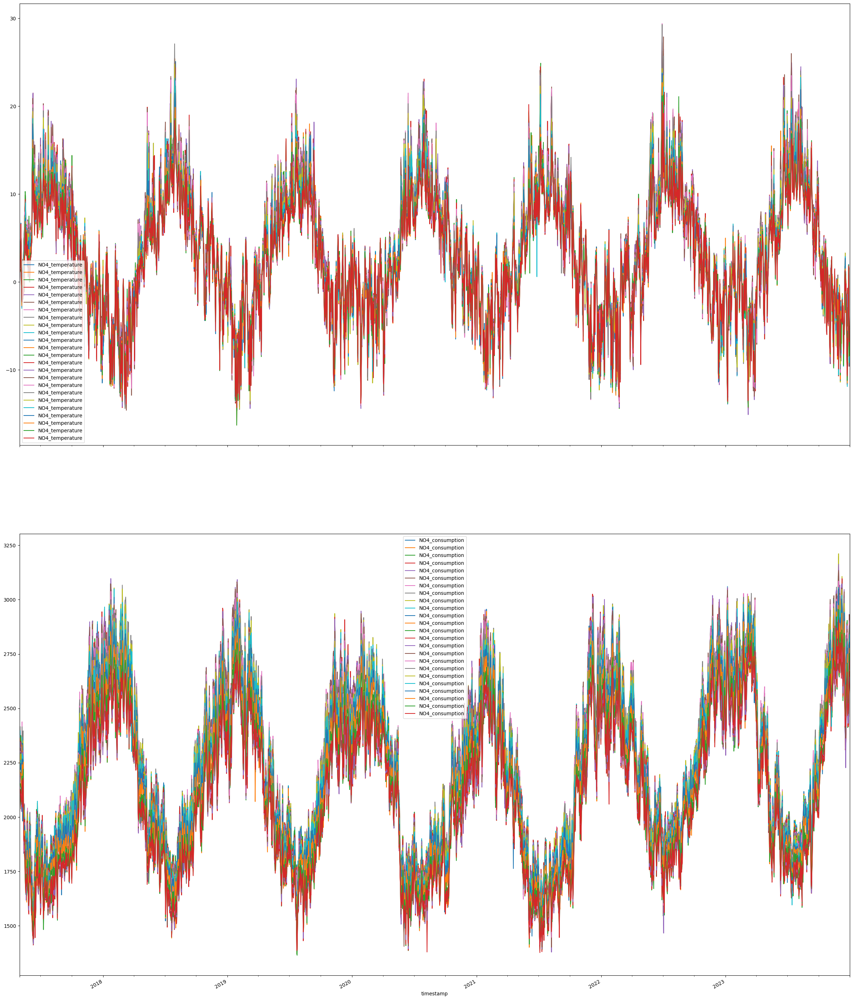

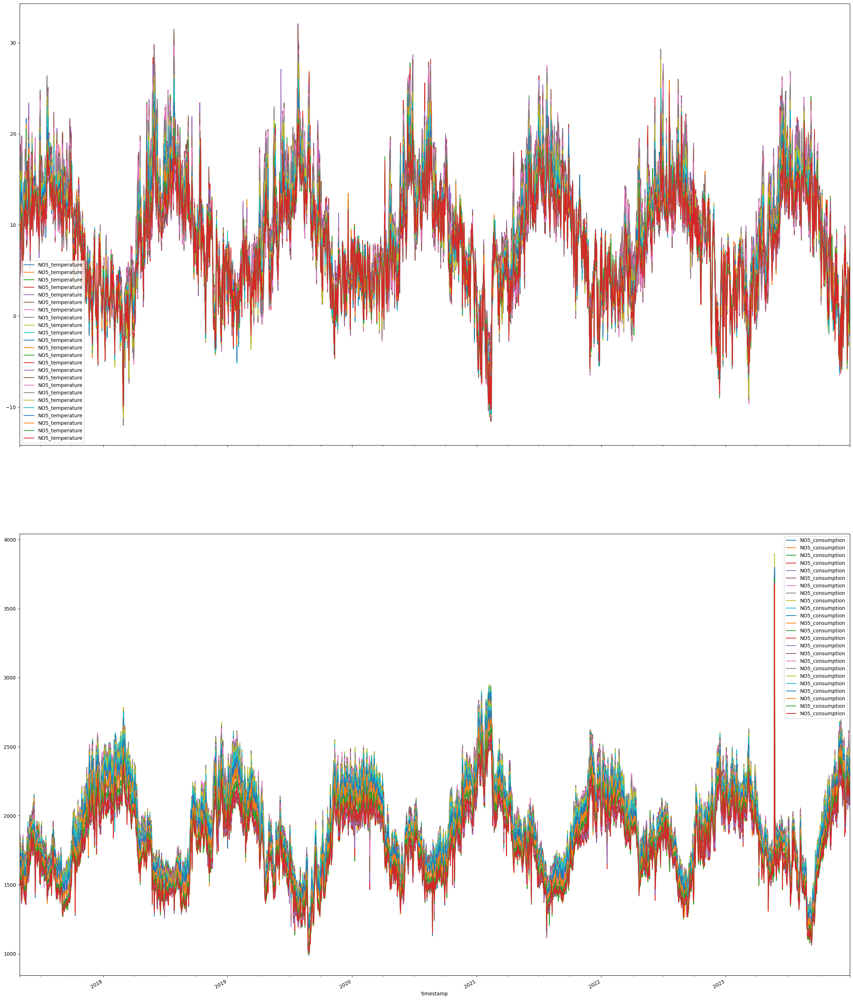

In [27]:
for i in range(1, 6):
    fig, axs = plt.subplots(2, 1, figsize=(30, 40), sharex=True)
    for h in range(24):
        data_hours[data_hours[f'hour_{h}']][['timestamp',f'NO{i}_temperature']].set_index('timestamp').plot(ax=axs[0], title=f'temperature on location {i}', label=f'temp hour={h}')
        data_hours[data_hours[f'hour_{h}']][['timestamp',f'NO{i}_consumption']].set_index('timestamp').plot(ax=axs[1], title=f'consumption on location {i}', label=f'cons hour={h}')
    plt.legend()
    plt.plot()